# Machine Failure Classification

## Objective

Predict whether the machine will fail or not, also predict the type of failure. So we are dealing with two predictions machine failure (binary) and type (multiclass)

## About the dataset

The dataset consists of 10 000 data points stored as rows with 14 features in columns

<li>UID: unique identifier ranging from 1 to 10000
<li>productID: consisting of a letter L, M, or H for low (50% of all products), medium (30%), and high (20%) as product quality variants and a variant-specific serial number
<li>air temperature [K]: generated using a random walk process later normalized to a standard deviation of 2 K around 300 K
<li>process temperature [K]: generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K.
<li>rotational speed [rpm]: calculated from powepower of 2860 W, overlaid with a normally distributed noise
<li>torque [Nm]: torque values are normally distributed around 40 Nm with an Ïƒ = 10 Nm and no negative values.
<li>tool wear [min]: The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the process. and a
'machine failure' label that indicates, whether the machine has failed in this particular data point for any of the following failure modes are true.

## Importing libraries

In [5]:
#Data handling
import pandas as pd
import numpy as np

#Data visualization 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.tree import plot_tree 

#Data preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import StratifiedKFold


#Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

#Evaluation metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

#Misc
import os 
import math

## Reading the dataset

In [6]:
INPUT_PATH = 'predictive_maintenance.csv'
df = pd.read_csv(INPUT_PATH)
df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure


## EDA

In [7]:
def summ(df):
    print(f"Shape : {df.shape}")
    summ = pd.DataFrame(df.dtypes, columns = ['data_type'])
    summ['#missing'] = df.isna().sum().values
    summ['%missing'] = df.isna().sum().values/ len(df)
    summ['#unique'] = df.nunique().values
    
    desc = pd.DataFrame(df.describe(include = 'all').transpose())
    summ['min'] = desc['min']
    summ['max'] = desc['max']
    summ['mean'] = desc['mean']
    
    summ['first_value'] = df.iloc[0]
    summ['second_value'] = df.iloc[1]
    summ['third_value'] = df.iloc[2]
    
    return summ

In [8]:
summ(df)

Shape : (10000, 10)


,data_type,#missing,%missing,#unique,min,max,mean,first_value,second_value,third_value
UDI,int64,0,0.0,10000,1.0,10000.0,5000.5,1,2,3
Product ID,object,0,0.0,10000,NaN,NaN,NaN,M14860,L47181,L47182
Type,object,0,0.0,3,NaN,NaN,NaN,M,L,L
Air temperature [K],float64,0,0.0,93,295.3,304.5,300.00493,298.1,298.2,298.1
Process temperature [K],float64,0,0.0,82,305.7,313.8,310.00556,308.6,308.7,308.5
Rotational speed [rpm],int64,0,0.0,941,1168.0,2886.0,1538.7761,1551,1408,1498
Torque [Nm],float64,0,0.0,577,3.8,76.6,39.98691,42.8,46.3,49.4
Tool wear [min],int64,0,0.0,246,0.0,253.0,107.951,0,3,5
Target,int64,0,0.0,2,0.0,1.0,0.0339,0,0,0
Failure Type,object,0,0.0,6,NaN,NaN,NaN,No Failure,No Failure,No Failure


Initial Observations:
<li> We won't be needing UDI and Product ID since it is different for every row
<li> There are six types of failure show in the Failure Type column
<li> We can extract product type from Product ID column but it is already extracted in the Type column

In [9]:
targets = ['Target', 'Failure Type']
features = [feature for feature in df.columns if feature not in targets]

Let's take a look at target distribution

In [10]:
px.histogram(df[targets[0]], color = df[targets[0]])

We a dealing with an imbalanced dataset, we only have 339 rows with failure

Let's look at the type of failures as well

In [11]:
px.histogram(df[targets[1]], color = df[targets[1]])

In [12]:
feature_df = df[features].drop(['UDI', 'Product ID'], axis = 1)

In [13]:
feature_df

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,M,298.1,308.6,1551,42.8,0
1,L,298.2,308.7,1408,46.3,3
2,L,298.1,308.5,1498,49.4,5
3,L,298.2,308.6,1433,39.5,7
4,L,298.2,308.7,1408,40.0,9
...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14
9996,H,298.9,308.4,1632,31.8,17
9997,M,299.0,308.6,1645,33.4,22
9998,H,299.0,308.7,1408,48.5,25


We have 1 categorical column and 5 numeric columns

Let's do a correlation analysis to see if there is any correlation among the variables

In [14]:
corr = feature_df.corr()
fig = px.imshow(corr, text_auto = True)
fig.update_layout(
    height = 800,
    width = 800
)

Initial observations:
<li>There is very high positive correlation between Process temperature and Air temperature
<li>There is very high negative correlation between Rotational speed and Torque

Let's try PCA to see if we can separate failure and non failure instances

In [15]:
feature_without_cat = feature_df.drop('Type', axis = 1)

In [16]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_without_cat)

#PCA
pca = PCA(n_components = 2)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.7503185814368961


In [17]:
px.scatter(pca_df, x = 'PC1', y = 'PC2', color = df[targets[0]])

In [18]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_without_cat)

#PCA
pca = PCA(n_components = 3)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2', 'PC3'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.9502338403508376


In [19]:
px.scatter_3d(pca_df, x = 'PC1', y = 'PC2', z = 'PC3', color = df[targets[0]])

The dataset doesn't seems to be linearly separable

In [20]:
feature_with_cat = feature_df.copy()
feature_with_cat['enc_type'] = [0 if enc == 'L' else 1 if enc == 'M' else 3 for enc in feature_with_cat['Type']]
feature_with_cat['enc_type'] = feature_with_cat['enc_type'].astype(np.int16)
feature_with_cat.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],enc_type
0,M,298.1,308.6,1551,42.8,0,1
1,L,298.2,308.7,1408,46.3,3,0
2,L,298.1,308.5,1498,49.4,5,0
3,L,298.2,308.6,1433,39.5,7,0
4,L,298.2,308.7,1408,40.0,9,0


In [21]:
feature_with_cat.drop('Type', axis = 1, inplace = True)

In [22]:
feature_with_cat.dtypes

Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]       int64
Torque [Nm]                float64
Tool wear [min]              int64
enc_type                     int16
dtype: object

In [23]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_with_cat)

#PCA
pca = PCA(n_components = 2)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.6253730555578567


In [24]:
px.scatter(pca_df, x = 'PC1', y = 'PC2', color = df[targets[0]])

In [25]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_with_cat)

#PCA
pca = PCA(n_components = 3)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2', 'PC3'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.7929018177356898


In [26]:
px.scatter_3d(pca_df, x = 'PC1', y = 'PC2', z = 'PC3', color = df[targets[0]])

Let's also take a look at the distribution of variables

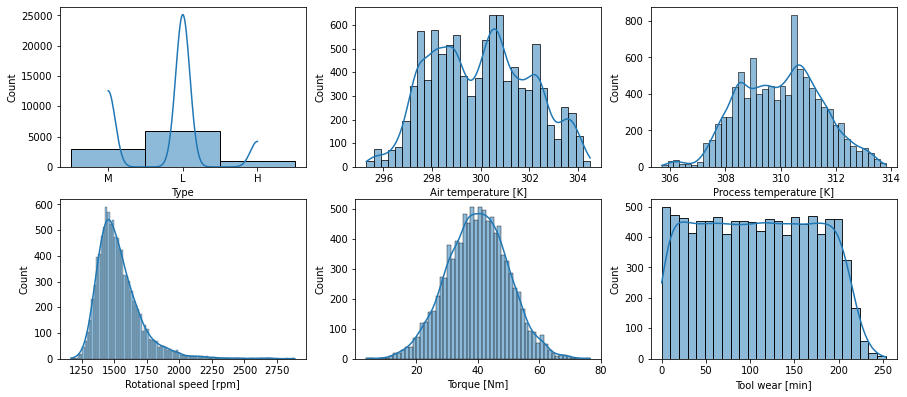

In [27]:
plt.figure(figsize=(15,10))
for i,col in enumerate(feature_df.columns,1):
    plt.subplot(3,3,i)
    sns.histplot(feature_df[col],kde=True)

In [28]:
feature_with_cat = pd.get_dummies(feature_df, drop_first = True)

In [29]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_with_cat)

#PCA
pca = PCA(n_components = 2)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.5360229636309053


In [30]:
px.scatter(pca_df, x = 'PC1', y = 'PC2', color = df[targets[0]])

In [31]:
#Scaling the features
scaler = StandardScaler()
feature_scaled = scaler.fit_transform(feature_with_cat)

#PCA
pca = PCA(n_components = 3)
pca_df = pd.DataFrame(pca.fit_transform(feature_scaled), columns = ['PC1', 'PC2', 'PC3'])
print(f"Explained variance : {np.cumsum(pca.explained_variance_ratio_)[-1]}")

Explained variance : 0.7932944857080346


In [32]:
px.scatter_3d(pca_df, x = 'PC1', y = 'PC2', z = 'PC3', color = df[targets[0]])

We should use the type feature

In [33]:
df[targets]

,Target,Failure Type
0,0,No Failure
1,0,No Failure
2,0,No Failure
3,0,No Failure
4,0,No Failure
...,...,...
9995,0,No Failure
9996,0,No Failure
9997,0,No Failure
9998,0,No Failure


We can just use the failure type column to detemine whether there is a failure or not, we don't need the Target column

Since we have a class imbalance problem, we should look at a few methods to handle it. We will be using oversampling in our case

In [34]:
X = pd.get_dummies(df[features].drop(['UDI', 'Product ID'], axis = 1), drop_first = True)
y = df[targets[1]]

## Oversampling

In [35]:
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [36]:
X

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Type_L,Type_M
0,298.100000,308.600000,1551,42.800000,0,0,1
1,298.200000,308.700000,1408,46.300000,3,1,0
2,298.100000,308.500000,1498,49.400000,5,1,0
3,298.200000,308.600000,1433,39.500000,7,1,0
4,298.200000,308.700000,1408,40.000000,9,1,0
...,...,...,...,...,...,...,...
57907,298.012513,308.484359,1428,37.715641,219,0,0
57908,298.670847,308.711847,1431,39.041695,222,1,0
57909,297.645965,307.696374,1608,35.803626,221,0,0
57910,300.983854,310.492150,1406,43.764645,219,0,1


In [37]:
y

0               No Failure
1               No Failure
2               No Failure
3               No Failure
4               No Failure
               ...        
57907    Tool Wear Failure
57908    Tool Wear Failure
57909    Tool Wear Failure
57910    Tool Wear Failure
57911    Tool Wear Failure
Name: Failure Type, Length: 57912, dtype: object

In [38]:
le = LabelEncoder()
y = le.fit_transform(y)

In [39]:
y

array([1, 1, 1, ..., 5, 5, 5])

In [40]:
X.shape, y.shape

((57912, 7), (57912,))

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, random_state = 42)

In [42]:
numeric_col = [col for col in X.columns if col not in ['Type_L', 'Type_M']]
categorical_col = [col for col in X.columns if col not in numeric_col]

In [43]:
def test_models(X_train, X_test, y_train, y_test):
    
    #Scaling numeric variables
    scaler = StandardScaler()
#     col_transform = ColumnTransformer([
#         ("scaler", scaler, numeric_col)
#     ], remainder='passthrough')
#     X_train = col_transform.fit_transform(X_train)
    
    #Logistic Regression
    lr = LogisticRegression(solver = 'sag')
    lr.fit(X_train, y_train)
    y_pred_lr = lr.predict(X_test)
    
    print("-"*12,'Logistic Regression','-'*12)
    print(f"Accuracy on test data : {accuracy_score(y_test, y_pred_lr)}")
    print(f"F1-Score on test data : {f1_score(y_test, y_pred_lr, average = 'macro')}")
    print(f"ROC AUC on test data : {roc_auc_score(y_test, lr.predict_proba(X_test), average = 'macro', multi_class = 'ovo')}")
    
    #Decision Tree
    dt = DecisionTreeClassifier()
    dt.fit(X_train, y_train)
    y_pred_dt = dt.predict(X_test)
    print("-"*12,'Decision Tree','-'*12)
    print(f"Accuracy on test data : {accuracy_score(y_test, y_pred_dt)}")
    print(f"F1-Score on test data : {f1_score(y_test, y_pred_dt, average = 'macro')}")
    print(f"ROC AUC on test data : {roc_auc_score(y_test, dt.predict_proba(X_test), average = 'macro', multi_class = 'ovo')}")
    
    #SVC
    svc = SVC(kernel='rbf', probability = True)
    svc.fit(X_train, y_train)
    y_pred_svc = svc.predict(X_test)
    print("-"*12,'Support Vector Classifier','-'*12)
    print(f"Accuracy on test data : {accuracy_score(y_test, y_pred_svc)}")
    print(f"F1-Score on test data : {f1_score(y_test, y_pred_svc, average = 'macro')}")
    print(f"ROC AUC on test data : {roc_auc_score(y_test, svc.predict_proba(X_test), average = 'macro', multi_class = 'ovo')}")
    

In [44]:
test_models(X_train, X_test, y_train, y_test)

C:\Users\Abhipreet\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



------------ Logistic Regression ------------
Accuracy on test data : 0.8188097156670887
F1-Score on test data : 0.811351402433267
ROC AUC on test data : 0.9601018034467532
------------ Decision Tree ------------
Accuracy on test data : 0.9905606078047657
F1-Score on test data : 0.9905619165609926
ROC AUC on test data : 0.9943735735845238
------------ Support Vector Classifier ------------
Accuracy on test data : 0.6978243352135375
F1-Score on test data : 0.6904150318166199
ROC AUC on test data : 0.9411423185439538


In [45]:
#Using the decision tree classifier
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
print(accuracy_score(y_test, y_pred_dt))
print(f1_score(y_test, y_pred_dt, average = 'macro'))
print(roc_auc_score(y_test, dt.predict_proba(X_test), average = 'macro', multi_class = 'ovo'))

0.9901001496489007
0.9900998619725904
0.994099864322976


In [46]:
 le.classes_

array(['Heat Dissipation Failure', 'No Failure', 'Overstrain Failure',
       'Power Failure', 'Random Failures', 'Tool Wear Failure'],
      dtype=object)

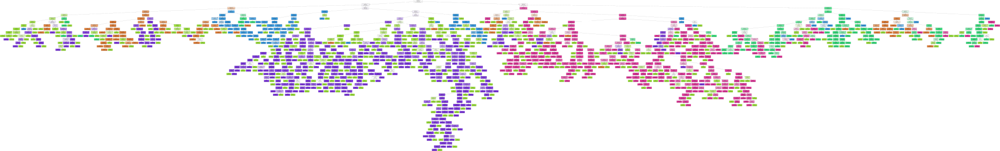

In [66]:
import graphviz
from sklearn import tree

# DOT data
dot_data = tree.export_graphviz(dt, out_file=None, 
                                feature_names=X_train.columns,  
                                class_names= le.classes_,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph